In [2]:
using Plots
using PyPlot
using WebIO
using Interact
import Random

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-14699597337744620139\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-4368166678801125654\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-14699597337744620139\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

### funkcja generująca środowisko z pakietami żywnościowymi

In [33]:
function environment(n::Int64, m::Int64)
    """
    funkcja tworząca środowisko wypełnione pakietami
    :param n:Int64: pierwszy wymiar srodowiska 
    :param m:Int64: drugi wymiar
    :return Environment:Array{Int64, 2}: środowisko
    """
    
    Environment = zeros(Int64, n, m)
    for i in 2:3:n
        Environment[i,:] = ones(Int64, 1, m)
    end
    return Environment
end

environment (generic function with 2 methods)

In [34]:
environment(20,20)

20×20 Array{Int64,2}:
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1 

### funkcja determinująca przeżycie gołębia w trakcie ucieczki od jastrzębia (50% prawdopodobieństwa)

In [35]:
function golab_jastrzab(n_gol::Int64)
    """funkcja determinująca przeżycie gołębia w trakcie ucieczki - 50%
    :param n_gol:Int64: ilość gołębi przed spotkaniem
    :return n_gol:Int64: ilość gołębi po spotkaniu
    """
    if rand(0:1) == 0
        n_gol = n_gol - 1
    end
    return n_gol
end

golab_jastrzab (generic function with 2 methods)

### funkcja determinująca stan populacji po wylosowaniu miejsc przy pakietach żywnościowych

In [38]:
function potyczki(n::Int64, m::Int64, macierz::Array{Int64,2}, g::Int64, ja::Int64)
    """funkcja determinująca stan populacji po wylosowaniu miejsc przy pakietach żywnościowych
    :param n: wymiar środowiska 
    :param m: wymiar środowiska
    :param macierz: macierz środowiska
    :param g: ilość gołębi przed potyczkami
    :param ja: ilość jastrzębi przed potyczkami
    :return g: ilość gołębi po potyczkach
    :return ja: ilość jastrzębi po potyczkach
    """
    for i in 2:3:n, j in 1:m    
        suma = macierz[i-1,j] + macierz[i+1,j]
        if suma == 11
            g = golab_jastrzab(g)
            ja = ja + 1
        elseif suma == 6
            g = g
        elseif suma == 16 
            ja = ja - 2
        elseif suma == 3
            g += 2
        elseif suma == 8
            j += 2
        end 
    return g,ja
    end
end

potyczki (generic function with 2 methods)

## update potyczek, żeby możliwa była analiza w customowym środowisku z pustymi pakietami

In [7]:
function potyczkiii(n, m, macierz, g, ja)
    """funkcja determinująca stan populacji po wylosowaniu miejsc przy pakietach żywnościowych
    :param n: wymiar środowiska 
    :param m: wymiar środowiska
    :param macierz: macierz środowiska
    :param g: ilość gołębi przed potyczkami
    :param ja: ilość jastrzębi przed potyczkami
    :return g: ilość gołębi po potyczkach
    :return ja: ilość jastrzębi po potyczkach
    """
    
    for i in 2:3:n, j in 1:m    
        suma = macierz[i-1,j] + macierz[i+1,j]
        if macierz[i,j] == 1
            if suma == 11
                g = golab_jastrzab(g)
                ja = ja + 1
            elseif suma == 6
                g = g
            elseif suma == 16 
                ja = ja - 2
            elseif suma == 3
                g += 2
            elseif suma == 8
                ja += 2
            end 
            
        elseif macierz[i,j] == 0
            if suma == 11
                g = g - 1
            elseif suma == 6
                g = g - 2
            elseif suma == 16 
                ja = ja - 2
            elseif suma == 3
                g -= 1
            elseif suma == 8
                ja -= 1
            end
        end
    return g,ja
    end
end

potyczkiii (generic function with 1 method)

### funkcja generująca rozstawienie ptaków w środowisku

In [40]:
function golabki(macierz::Array, ngol::Int64)
    """funkcja generująca rozstawienie gołębi w środowisku
    :param macierz: macierz środowiska
    :param ngol: ilość gołębi
    """

    if ngol != 0  
        for i in 1:1:ngol
            z = findall(x -> x ==0, macierz)
            macierz[rand(z)] = 3
        end
    end
    return macierz
end

function jastrzabki(macierz::Array, njas::Int64)
    """funkcja generująca rozstawienie jastrzębi w środowisku
    :param macierz: macierz środowiska
    :param ngol: ilość jastrzębi
    """
    if njas != 0
        for i in 1:1:njas
            z = findall(x -> x ==0, macierz)
            macierz[rand(z)] = 8
        end
    end
    return macierz
end

jastrzabki (generic function with 2 methods)

### funkcja sprawdzająca nadmiar populacji i ilość ptaków wysłaną na wygnanie/ fight club

In [10]:
function check(n::Int64, m::Int64, ng::Int64, nja::Int64)
    """funkcja sprawdzająca nadmiar populacji i ilość ptaków wysłaną na wygnanie
    :param n: wymiar środowiska 
    :param m: wymiar środowiska
    :param ng: ilość gołębi
    :param nja: ilość jastrzębi
    :return ng: ilość gołębi w normalnym środowisku
    :return nja: ilość jastrzębi w normalnym środowisku
    :return fight_g: ilość gołębi na wygnaniu
    :return fight_ja: ilość jastrzębi na wygnaniu
    """
    if ng + nja > 2*n*m/3
        env_ng = Int64(round(ng/(ng+nja) * 2*n*m/3))
        env_ja = Int64(round(nja/(ng+nja) * 2*n*m/3))
        fight_g = ng - env_ng
        fight_ja = nja - env_ja
        ng = env_ng
        nja = env_ja
        return ng, nja, fight_g, fight_ja
    else
        fight_g = 0
        fight_ja = 0
        return ng, nja, fight_g, fight_ja
    end
end


check (generic function with 1 method)

### funkcja do fightclubu

In [42]:
function fight_club(n_gol::Int64, n_jas::Int64)
    """funkcja determinująca sytuację na wygnaniu, tworząca macierz środowiska
    :param n_gol: liczba gołębi przed walką
    :param n_gol: liczba jastrzębi przed walką
    :return M: macierz środowiska
    """
    if (n_gol + n_jas)%2 == 0
        n = Int64((n_gol + n_jas)/2)
        M = zeros(Int64, 2, n)
        if n_gol != 0
            golabki(M, n_gol)
        end
        if n_jas!=0
            jastrzabki(M, n_jas)
        end
    else
        n = Int64((n_gol + n_jas + 1)/2) 
        M = zeros(Int64, 2, n)
        if n_gol != 0
            golabki(M, n_gol)
        end
        if n_jas!=0
            jastrzabki(M, n_jas)
        end
    end
    return M
end
     

fight_club (generic function with 2 methods)

In [12]:

function fight(macierz::Array, n_gol::Int64, n_jas::Int64)
    """funkcja determinująca sytuację na wygnaniu, tworząca macierz środowiska
    :param macierz: macierz środowiska na wygnaniu
    :param n_gol: liczba gołębi przed walką
    :param n_gol: liczba jastrzębi przed walką
    :return n_gol: liczba gołębi po walce
    :return n_jas: liczba jastrzębi po walce
    """
    for i in 1:size(macierz)[2]
        suma = macierz[1,i] + macierz[2,i]
        if suma == 6
            n_gol -= 1
        elseif suma == 16
            n_jas -= 1
        elseif suma == 11
            if rand(0:1) == 0
                n_gol -= 1
            else
                n_jas -= 1
            end
        end
    end
    return n_gol, n_jas
end

fight (generic function with 1 method)

### Generowanie środowiska z mniejszą ilością pakietów (na wypadek przykładowej suszy/ pożaru)

In [13]:
function environment_food_amount(size1 = 21, size2 = 21, amount = 100)
    """funkcja generująca środowiska z mniejszą ilościa pakietów
    :param size1:Int64: wymiar środowiska
    :param size2:Int64: wymiar środowiska
    :param amount:Int64: ilość pakietów
    :return Environment: środowisko
    """
#ilość wieszy musi być podzielna przez 3
    if size1 % 3 != 0
        throw(DomainError(size, "incorrect size"))
    end
    Environment = zeros(Int64, size1, size2)
    A = zeros(Int64, 1, size2*(fld(size1-2,3)+1))
    A[1,1:amount] = ones(Int64, 1, amount)
    A = Random.shuffle(A)
    k = 1
    for i in 2:3:size1
        Environment[i,:] = A[1, k:(k+size1-1)]
        k += size1
    end
    return Environment
end

environment_food_amount (generic function with 4 methods)

# funkcja główna + wykresy

In [43]:
function action(n::Int64, m::Int64, n_gol::Int64, n_jas::Int64, p::Int64, A, pack = 1, index = 1) ##pack to opcjonalna liczba pakietów
    """główna funkcja generująca statystyki populacji
    :param n: wymiar środowiska 
    :param m: wymiar środowiska
    :param n_gol: ilość gołębi
    :param n_jas: ilość jastrzębi
    :param p: ilość wykonań funkcji (ilość dni)
    :param A: macierz startowa, o pierwszym wymiarze identycznym z param p
    :param pack: ilość pakietów, domyślnie jest to maksymalna ilość
    :param index: indeks służący do generowania wykresów
    :return A: środowisko końcowe, gdy skończył się zakres p
    """
    
    if p == 0
        return A
    end
   
    if pack == 1 # czyli max pakietów, brak nieurodzaju
        srod = environment(n,m) ##mamy pakiety
    else
        if pack < 1/3*n*m
            srod = environment_food_amount(n,m,pack)
        else
            pack = 1
            srod = environment(n,m)
        end
    end
    #print(srod)
    a = check(n, m, n_gol, n_jas) #sprawdzamy czy nie ma za dużo ptaszków, zwraca jako (gol_safe, jas_safe, gol_fight, jas_fight)
    n_gol = a[1]
    n_jas = a[2]

    golabki(srod, n_gol)
    jastrzabki(srod, n_jas)  ##mamy srodowisko z ptaszkami
    
    result = potyczkiii(n,m,srod, n_gol, n_jas) ##mamy stan populacji po potyczkach
    n_gol = result[1] ##liczba gołębi
    n_jas = result[2]
    
    ##w miedzyczasie fight club :
    
    
    b = fight(fight_club(a[3],a[4]), a[3], a[4]) #populacja po fight clubie - (gol, jas)
    
    n_gol += b[1] ##ostateczna ilosc golebi - ta bezpieczna + fight club
    n_jas += b[2] ## -||- jastrzebi
    gol_fight = b[1] ##ilość ptakow po fightcie, może się przyda c:
    jas_fight = b[2]
    
    A[index, 1] = n_gol
    A[index, 2] = n_jas
    index += 1
    #println(n_gol,",", n_jas,",", gol_fight, ",",jas_fight)
    
    action(n, m, n_gol, n_jas, p-1, A, pack, index) #i lecimy rekurencją
end

action (generic function with 6 methods)

## Funkcja rysująca wykresy

In [45]:
function wykr(gif_name::String, n::Int64, m::Int64, g::Int64, j::Int64, p::Int64, A::Array, pack = 1, index = 1)
    """ funkcja generująca wykresy populacji ptaków
    :param gif_name: nazwa gifa
    :param n: wymiar środowiska 
    :param m: wymiar środowiska
    :param n_gol: ilość gołębi
    :param n_jas: ilość jastrzębi
    :param p: ilość wykonań funkcji (ilość dni)
    :param A: macierz startowa, o pierwszym wymiarze identycznym z param p
    :param pack: ilość pakietów, domyślnie jest to maksymalna ilość
    :param index: indeks służący do generowania wykresów

    """
    A = action(n, m, g, j, p, A, pack, index)
    animation = @animate for i in 1:size(A)[1]
    Plots.plot(1:i, A[1:i,1], label = "gołębie", color = :purple)
    Plots.plot!(1:i, A[1:i, 2], label = "jastrzębie", color = :green)
    end
gif(animation, gif_name, fps = 10)
end

wykr (generic function with 6 methods)

## zobrazowanie populacji w normalnych warunkach

┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\pakiety\animation1.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\pakiety\\animation1.gif")
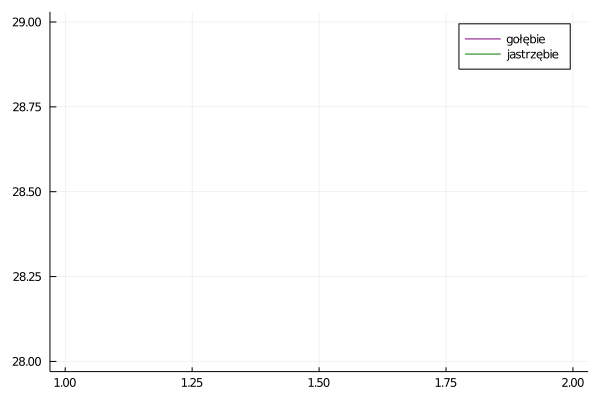

In [46]:
wykr("animation1.gif",9,9,30,30, 100, zeros(Int64, 100, 2))

┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\pakiety\animation2.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\pakiety\\animation2.gif")
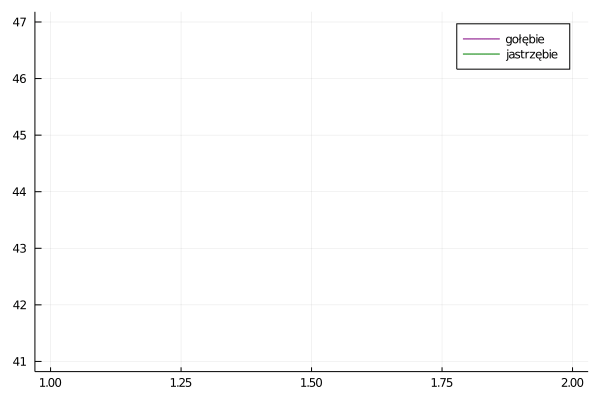

In [47]:
wykr("animation2.gif",9,9,60,60, 100, zeros(Int64, 100, 2))

┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\pakiety\animation3.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\pakiety\\animation3.gif")
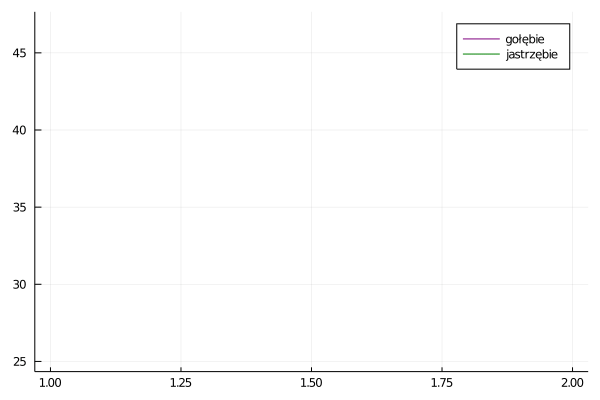

In [48]:
wykr("animation3.gif",9,9,60,30, 100, zeros(Int64, 100, 2))

┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\pakiety\animation5.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\pakiety\\animation5.gif")
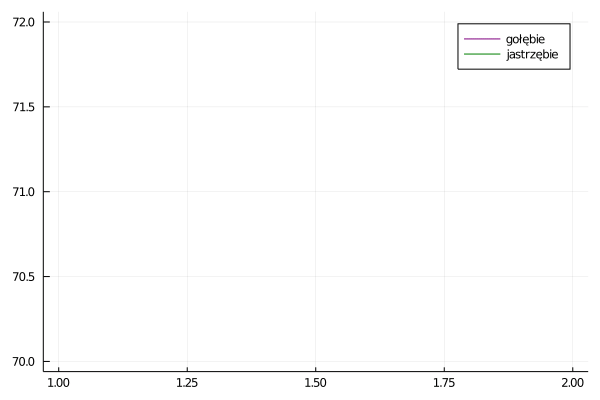

In [49]:
wykr("animation5.gif",15,15,70,70, 100, zeros(Int64, 100, 2))

## zachowanie w środowisku z ograniczonym dostępem do pakietów

┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\pakiety\animation4.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\pakiety\\animation4.gif")
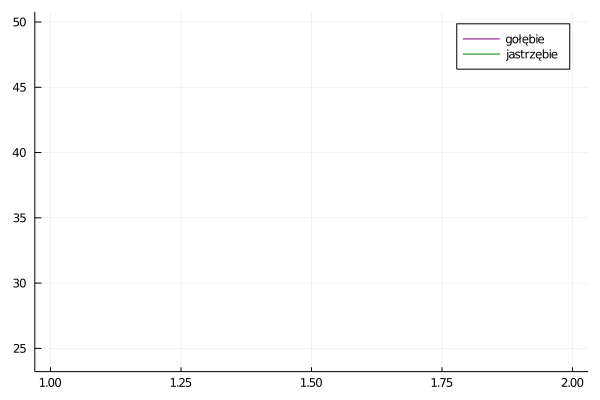

In [50]:
wykr("animation4.gif",9,9,30,60, 100, zeros(Int64, 100, 2), 20)

┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\pakiety\animation4.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\pakiety\\animation4.gif")
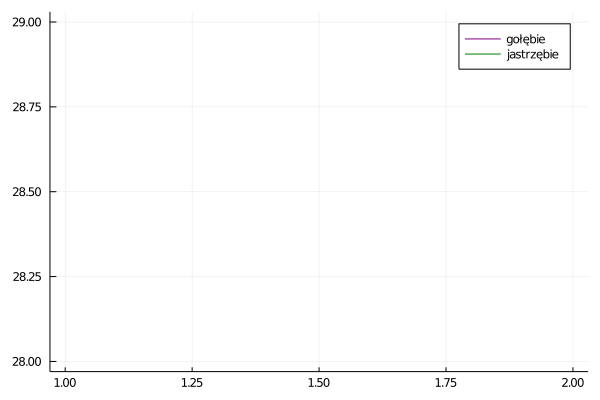

In [51]:
wykr("animation4.gif",9,9,30,30, 200, zeros(Int64, 200, 2), 5)